In [1]:
import numpy as np
import os
import torch
from torch.utils.data import DataLoader
from data import MemmapDataset
from models import *
from training_utils import *
import torchvision.transforms.v2 as v2
from torchvision import tv_tensors

a:\anaconda3\envs\machine\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Constants for training
DATA_SPLIT = 0.9
INIT_LR = 1e-4
NUM_EPOCHS = 30
BATCH_SIZE = 32
INPUT_IMAGE_SIZE = 224
THRESHOLD = 0.5
DEVICE = setup_device()
EXPERIMENT_NAME = "SegFormer_ManualWeighted_With_Augs_JaccardLoss"

classes ={
    (255,0,0): "HUMAN_ARTIFACT",
    (0,255,0): "VEGETATION",
    (0,0,255): "BUILDING",
    (255,255,0): "CAR",
    (0,255,255): "LOW_VEGETATION",
    (255,255,255): "ROAD"
}

class_names = [
    "HUMAN_ARTIFACT",  # 0
    "VEGETATION",      # 1
    "BUILDING",        # 2
    "CAR",            # 3
    "LOW_VEGETATION", # 4
    "ROAD"            # 5
]

rgb_to_class = {
    (255,   0,   0): 0,  # HUMAN_ARTIFACT
    (  0, 255,   0): 1,  # VEGETATION
    (  0,   0, 255): 2,  # BUILDING
    (255, 255,   0): 3,  # CAR
    (  0, 255, 255): 4,  # LOW_VEGETATION
    (255, 255, 255): 5   # ROAD
}

# define the path to each directory
BASE_DIR = "C:\\Users\\gwrye\\Downloads\\Vaihingen_Potsdam_09cm\\combined_dataset"
IMAGE_DIR = os.path.join(BASE_DIR, "images.npy")
LABEL_DIR = os.path.join(BASE_DIR, "converted_labels.npy")

train_transforms = v2.Compose([
    v2.ToImage(),
    
    # Geometric augmentations
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    # Intensive augmentations
    v2.RandomAdjustSharpness(sharpness_factor=1.1, p=0.4),
    v2.RandomPerspective(distortion_scale=0.2, p=0.4),

    # Random crop
    v2.Resize(size=(INPUT_IMAGE_SIZE + (INPUT_IMAGE_SIZE // 2), INPUT_IMAGE_SIZE + (INPUT_IMAGE_SIZE // 2))),
    v2.RandomRotation(degrees=(-15, 15)),
    v2.RandomResizedCrop(size=(INPUT_IMAGE_SIZE, INPUT_IMAGE_SIZE), scale=(0.8, 1.0), ratio=(0.75, 1.33)),
    
    # Convert to tensor and normalize
    v2.ToDtype({tv_tensors.Image: torch.float32, tv_tensors.Mask: torch.long}),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = v2.Compose([
    v2.ToDtype({tv_tensors.Image: torch.float32, tv_tensors.Mask: torch.long}),
    v2.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225))
])


# Build the dataset and split it into training and test sets
dataset = SegmentationDataset(IMAGE_DIR, LABEL_DIR, transforms=train_transforms)

trainDS, testDS = dataset.split(DATA_SPLIT, valid_transforms=val_transforms)
del dataset

# create data loaders
trainLoader = DataLoader(trainDS, shuffle=True, batch_size=BATCH_SIZE)
testLoader = DataLoader(testDS, shuffle=False, batch_size=BATCH_SIZE)

print(f"Dataset containing {len(trainDS)} images loaded.")
del trainDS, testDS

Using CUDA device.
Dataset containing 15770 images loaded.


In [3]:
# Weighted loss function for class imbalance
class CE_Focal_Loss(nn.Module):
    def __init__(self, class_weights, ignore_index=255):
        super().__init__()
        self.ce_loss = nn.CrossEntropyLoss(weight=class_weights, ignore_index=ignore_index)
        self.focal_loss = WeightedMultiClassFocalLoss(alpha=class_weights, gamma=2, ignore_index=ignore_index)
        
    def forward(self, inputs, targets):
        ce = self.ce_loss(inputs, targets)
        focal = self.focal_loss(inputs, targets)
        return 0.7 * ce + 0.3 * focal
    
class Jaccard_CE_Focal_Loss(nn.Module):
    def __init__(self, class_weights, ignore_index=255):
        super().__init__()
        self.jaccard_loss = JaccardLoss(num_classes=len(class_weights), ignore_index=ignore_index)
        self.ce_loss = nn.CrossEntropyLoss(weight=class_weights, ignore_index=ignore_index)
        self.focal_loss = WeightedMultiClassFocalLoss(alpha=class_weights, gamma=2, ignore_index=ignore_index)
        
    def forward(self, inputs, targets):
        jaccard = self.jaccard_loss(inputs, targets)
        ce = self.ce_loss(inputs, targets)
        focal = self.focal_loss(inputs, targets)
        return 0.7 * ce + 0.3 * focal + 0.6 * jaccard

class_weights = calculate_class_weights(LABEL_DIR, classes, power=1.5).to(DEVICE)
print("weights:", class_weights)

# Add weight to human artifact class
class_weights[0] *= 2.0
# Reduce weight for car
class_weights[3] *= 0.5
# Add weight to low vegetation class
class_weights[4] *= 1.5
# Add weight to road class
class_weights[5] *= 2.0
print("adjusted weights:", class_weights)
LOSS = Jaccard_CE_Focal_Loss(class_weights, ignore_index=255)

Class distribution:
  HUMAN_ARTIFACT : 47,673,296 pixels (  5.4%)
  VEGETATION     : 131,558,818 pixels ( 15.0%)
  BUILDING       : 223,959,041 pixels ( 25.5%)
  CAR            : 13,376,896 pixels (  1.5%)
  LOW_VEGETATION : 234,613,662 pixels ( 26.7%)
  ROAD           : 228,052,335 pixels ( 25.9%)
weights: tensor([0.7289, 0.1590, 0.0716, 4.9041, 0.0668, 0.0697], device='cuda:0')
adjusted weights: tensor([1.4578, 0.1590, 0.0716, 2.4520, 0.1001, 0.1393], device='cuda:0')


In [ ]:
# Initialize the model, training session, and start training
model = SegFormer(input_image_size=INPUT_IMAGE_SIZE, num_classes=len(classes))
Machine = TrainingSession(model, trainLoader, testLoader, LOSS, init_lr=INIT_LR, num_epochs=NUM_EPOCHS, experiment_name=EXPERIMENT_NAME)
Machine.learn()

Machine.plot_loss(y_max=1.2)
print("Available Metrics:", Machine.get_available_metrics())
Machine.plot_metrics("Metrics")

Sample 0 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 538.143]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 2, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


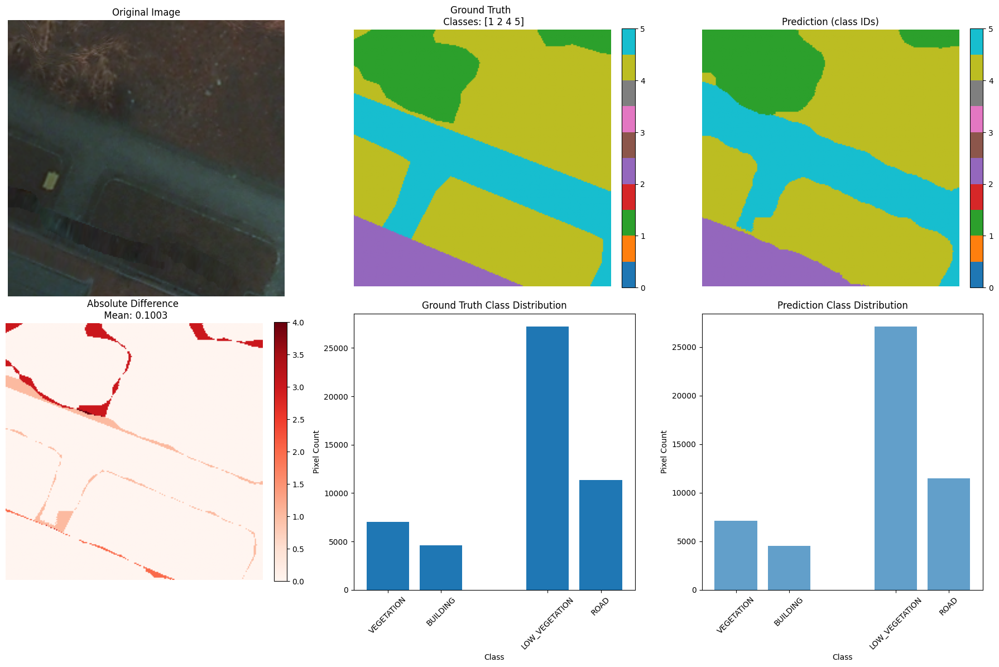


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,044 pixels (14.0%)
  BUILDING: 4,597 pixels (9.2%)
  LOW_VEGETATION: 27,200 pixels (54.2%)
  ROAD: 11,335 pixels (22.6%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 3.6263

Accuracy metrics:
  Pixel-wise accuracy: 0.9484 (94.84%)
  Mean absolute error: 0.1003
  Max error: 4.0000
  ✅ Very good predictions!
Sample 1 info:
  Image shape: torch.Size([3, 224, 224]), range: [69.307, 860.418]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 3, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


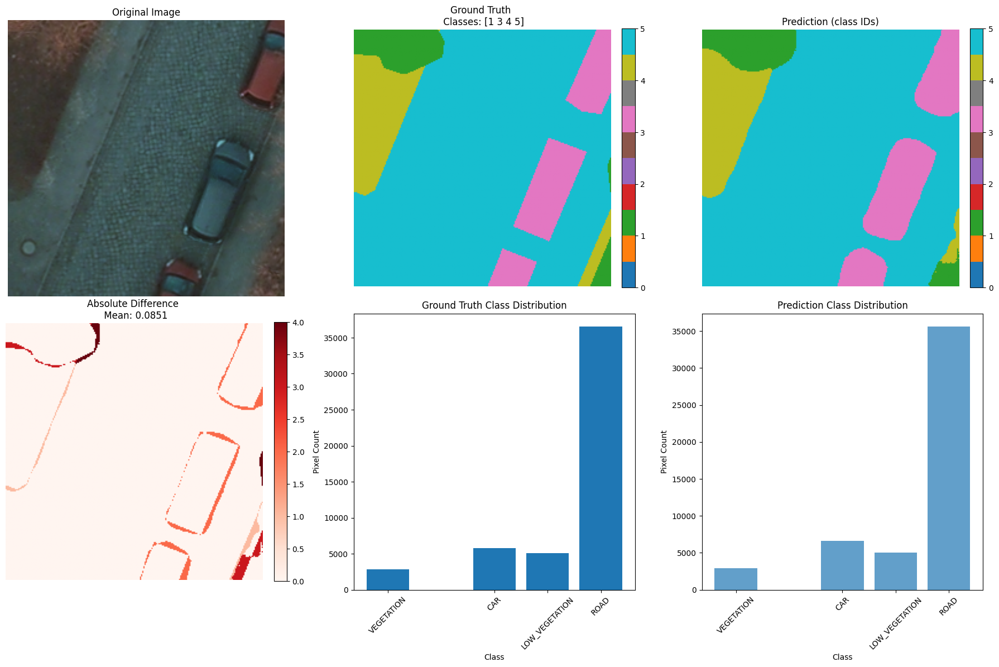


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 2,813 pixels (5.6%)
  CAR: 5,752 pixels (11.5%)
  LOW_VEGETATION: 5,073 pixels (10.1%)
  ROAD: 36,538 pixels (72.8%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 4.4041

Accuracy metrics:
  Pixel-wise accuracy: 0.9618 (96.18%)
  Mean absolute error: 0.0851
  Max error: 4.0000
  ✅ Very good predictions!
Sample 2 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 538.143]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 2, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


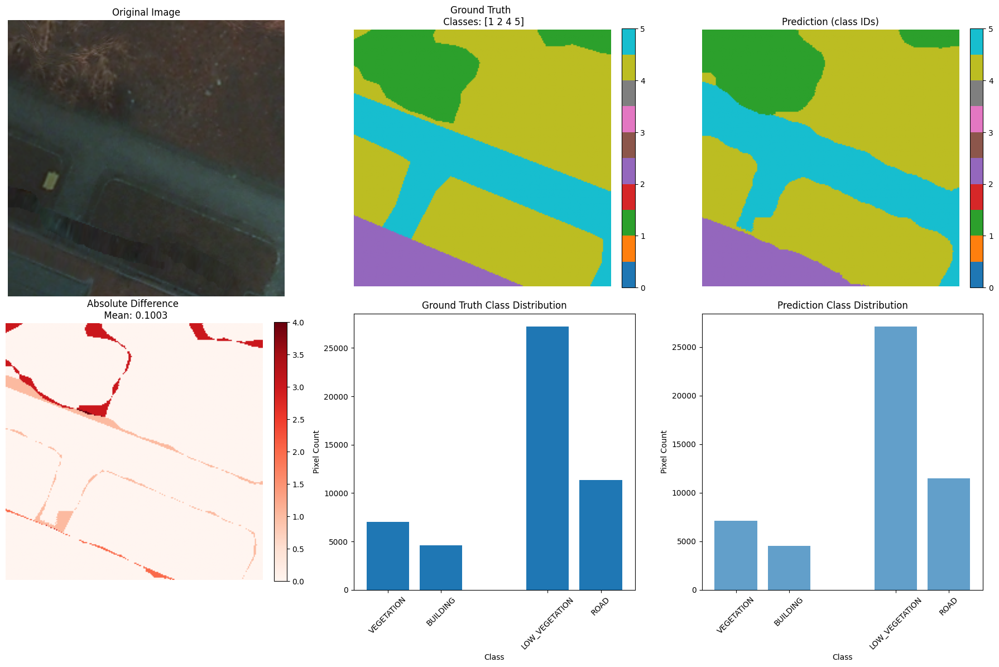


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,044 pixels (14.0%)
  BUILDING: 4,597 pixels (9.2%)
  LOW_VEGETATION: 27,200 pixels (54.2%)
  ROAD: 11,335 pixels (22.6%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 3.6263

Accuracy metrics:
  Pixel-wise accuracy: 0.9484 (94.84%)
  Mean absolute error: 0.1003
  Max error: 4.0000
  ✅ Very good predictions!
Sample 3 info:
  Image shape: torch.Size([3, 224, 224]), range: [69.307, 860.418]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 3, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


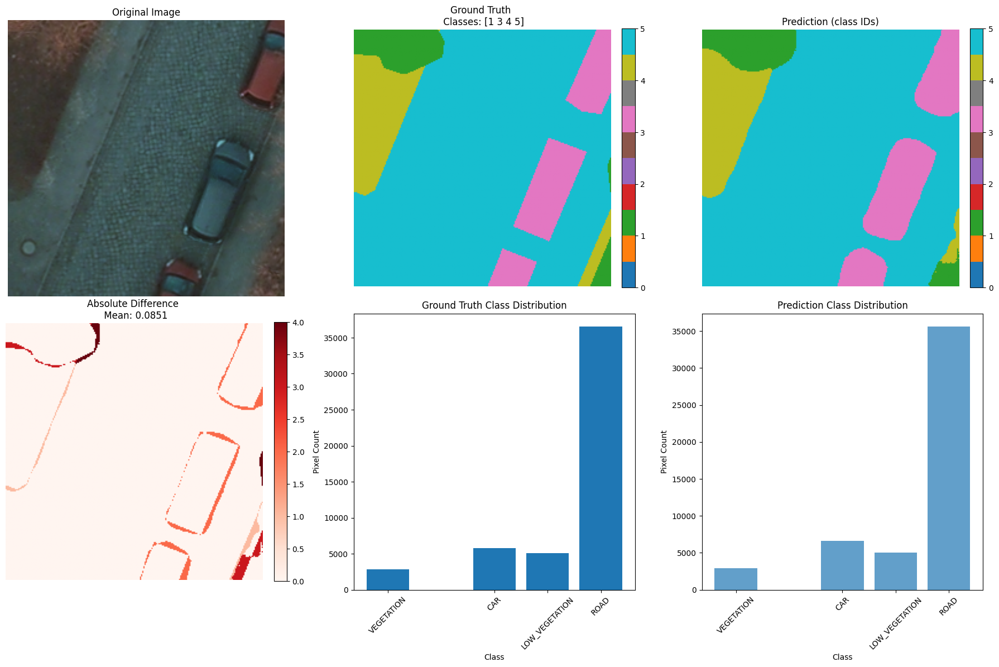


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 2,813 pixels (5.6%)
  CAR: 5,752 pixels (11.5%)
  LOW_VEGETATION: 5,073 pixels (10.1%)
  ROAD: 36,538 pixels (72.8%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 4.4041

Accuracy metrics:
  Pixel-wise accuracy: 0.9618 (96.18%)
  Mean absolute error: 0.0851
  Max error: 4.0000
  ✅ Very good predictions!
Sample 4 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 538.143]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 2, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


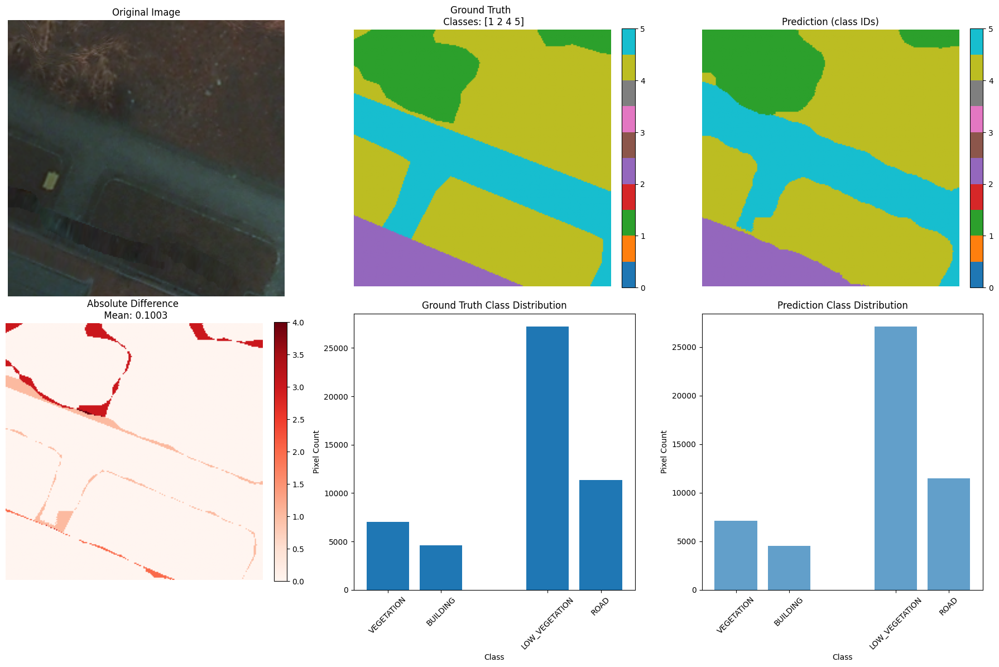


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,044 pixels (14.0%)
  BUILDING: 4,597 pixels (9.2%)
  LOW_VEGETATION: 27,200 pixels (54.2%)
  ROAD: 11,335 pixels (22.6%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 3.6263

Accuracy metrics:
  Pixel-wise accuracy: 0.9484 (94.84%)
  Mean absolute error: 0.1003
  Max error: 4.0000
  ✅ Very good predictions!
Sample 5 info:
  Image shape: torch.Size([3, 224, 224]), range: [109.307, 753.341]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 4])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 4.000]


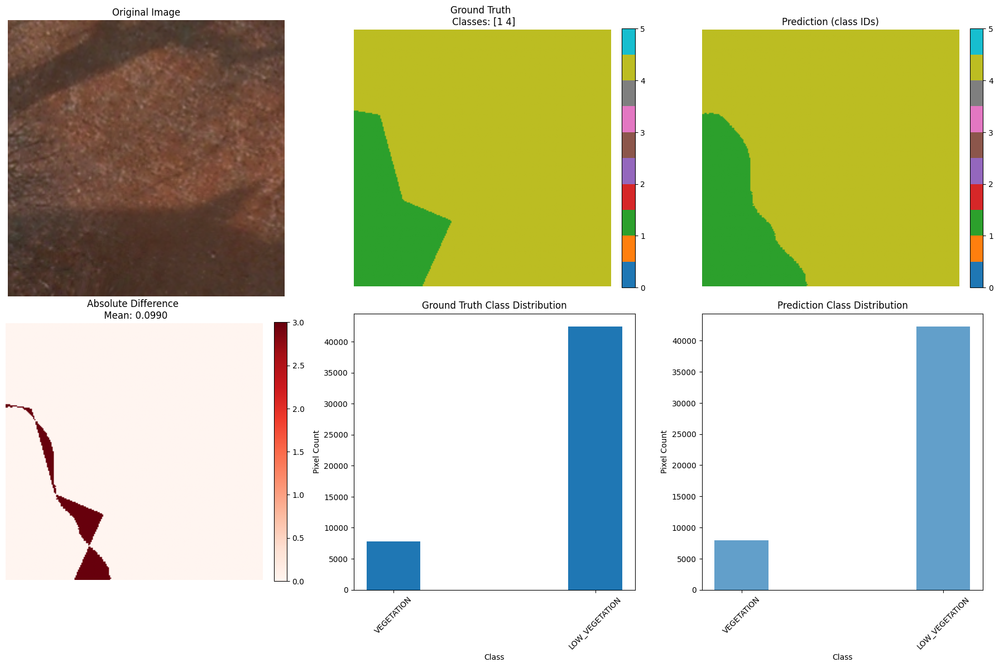


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,757 pixels (15.5%)
  LOW_VEGETATION: 42,419 pixels (84.5%)

Prediction statistics:
  Raw prediction range: [1.0000, 4.0000]
  Raw prediction mean: 3.5264

Accuracy metrics:
  Pixel-wise accuracy: 0.9670 (96.70%)
  Mean absolute error: 0.0990
  Max error: 3.0000
  ✅ Very good predictions!
Sample 6 info:
  Image shape: torch.Size([3, 224, 224]), range: [109.307, 753.341]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 4])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 4.000]


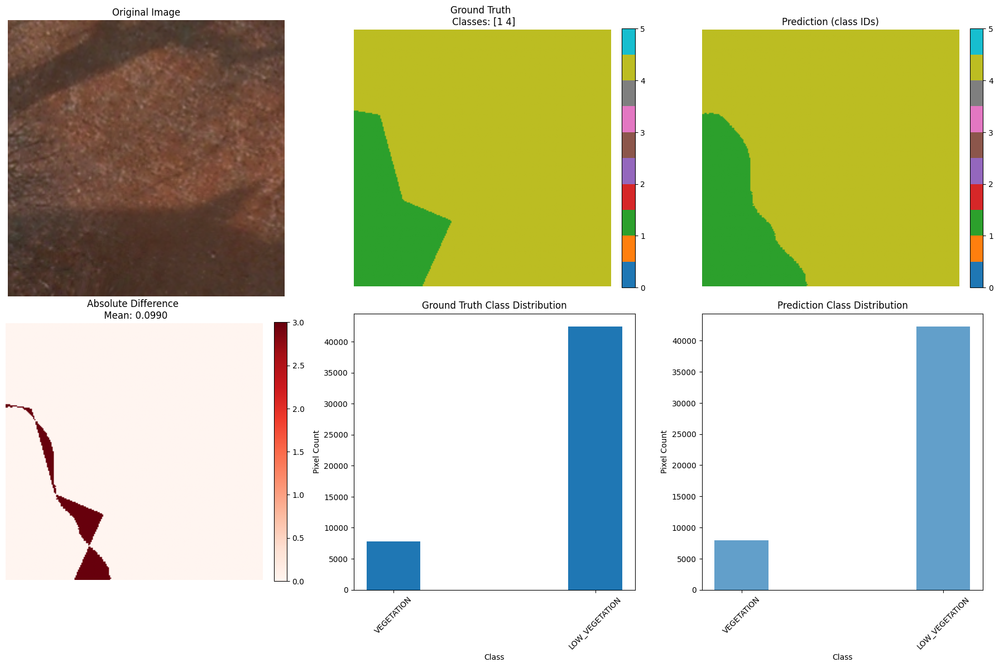


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,757 pixels (15.5%)
  LOW_VEGETATION: 42,419 pixels (84.5%)

Prediction statistics:
  Raw prediction range: [1.0000, 4.0000]
  Raw prediction mean: 3.5264

Accuracy metrics:
  Pixel-wise accuracy: 0.9670 (96.70%)
  Mean absolute error: 0.0990
  Max error: 3.0000
  ✅ Very good predictions!
Sample 7 info:
  Image shape: torch.Size([3, 224, 224]), range: [33.751, 753.341]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 3, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


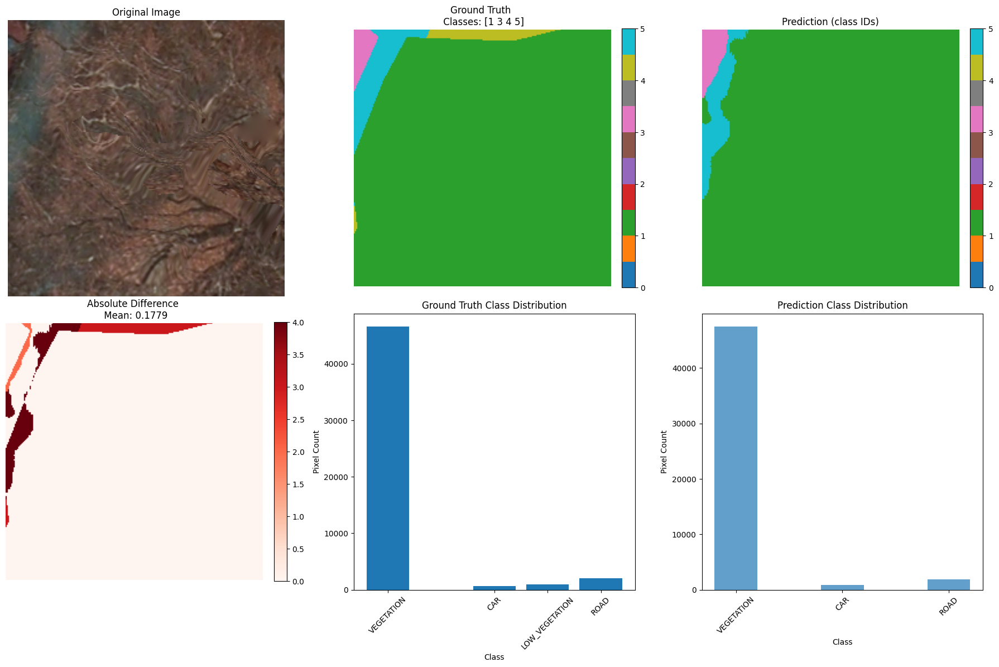


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 46,576 pixels (92.8%)
  CAR: 638 pixels (1.3%)
  LOW_VEGETATION: 942 pixels (1.9%)
  ROAD: 2,020 pixels (4.0%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 1.1821

Accuracy metrics:
  Pixel-wise accuracy: 0.9484 (94.84%)
  Mean absolute error: 0.1779
  Max error: 4.0000
  ✅ Very good predictions!
Sample 8 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 673.751]
  Target shape: torch.Size([224, 224]), unique values: tensor([0, 1, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [0.000, 5.000]


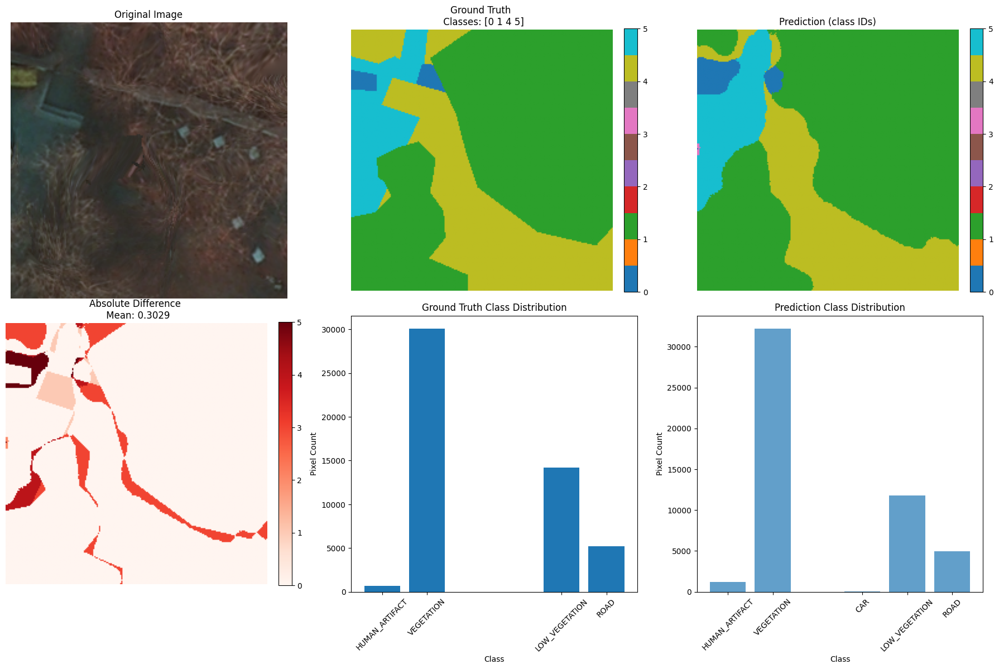


DETAILED ANALYSIS:
Target class distribution:
  HUMAN_ARTIFACT: 688 pixels (1.4%)
  VEGETATION: 30,070 pixels (59.9%)
  LOW_VEGETATION: 14,221 pixels (28.3%)
  ROAD: 5,197 pixels (10.4%)

Prediction statistics:
  Raw prediction range: [0.0000, 5.0000]
  Raw prediction mean: 2.0777

Accuracy metrics:
  Pixel-wise accuracy: 0.8978 (89.78%)
  Mean absolute error: 0.3029
  Max error: 5.0000
  📊 Decent predictions
Sample 9 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 673.751]
  Target shape: torch.Size([224, 224]), unique values: tensor([0, 1, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [0.000, 5.000]


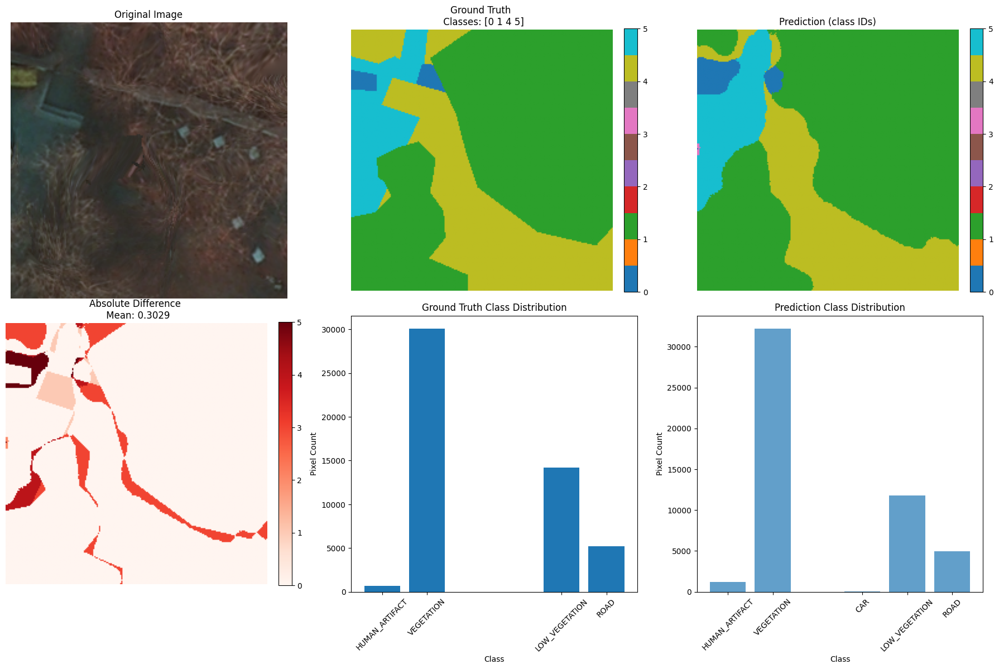


DETAILED ANALYSIS:
Target class distribution:
  HUMAN_ARTIFACT: 688 pixels (1.4%)
  VEGETATION: 30,070 pixels (59.9%)
  LOW_VEGETATION: 14,221 pixels (28.3%)
  ROAD: 5,197 pixels (10.4%)

Prediction statistics:
  Raw prediction range: [0.0000, 5.0000]
  Raw prediction mean: 2.0777

Accuracy metrics:
  Pixel-wise accuracy: 0.8978 (89.78%)
  Mean absolute error: 0.3029
  Max error: 5.0000
  📊 Decent predictions


In [9]:
for i in range(10):
    new_dataset = MemmapDataset(np.load(IMAGE_DIR, 'r+'), np.load(LABEL_DIR, 'r+'), transforms=val_transforms)
    visualize_segmentation_results(model, new_dataset, raw_images=np.load(IMAGE_DIR, 'r+'), sample_idx=i, class_names=class_names, device=DEVICE)

In [4]:
weights = "nvidia/segformer-b0-finetuned-ade-512-512"
EXPERIMENT_NAME = "Smol_SegFormer"
smol_segformer = SegFormer(input_image_size=INPUT_IMAGE_SIZE, num_classes=len(classes), weights=weights)
smol_machine = TrainingSession(smol_segformer, trainLoader, testLoader, LOSS, init_lr=INIT_LR, num_epochs=NUM_EPOCHS, experiment_name=EXPERIMENT_NAME)
smol_machine.learn()

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([6]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([6, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-09-24 23:12:10,838 - INFO - Starting training: 30 epochs
2025-09-24 23:12:10,839 - INFO - Model parameters: 4,373,542


Using CUDA device: NVIDIA GeForce RTX 5090
GPU Memory: 31.8 GB


Epoch 1/30: 100%|██████████| 493/493 [02:44<00:00,  2.99it/s, loss=0.7410, lr=0.000100]
2025-09-24 23:15:00,038 - INFO - Epoch   1 | Train Loss: 0.7340 | Val Loss: 0.8345 | IoU: 0.3324
2025-09-24 23:15:00,038 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5341852903366089, 'Precision': 0.5388367647926012, 'Recall': 0.5472647771239281, 'IOU': 0.33240898822744686, 'Mean_Precision': 0.5388367647926012, 'Mean_Recall': 0.5472647771239281, 'class_ious': [0.055251531302928925, 0.5854512453079224, 0.5104193091392517, 0.316254198551178, 0.20367130637168884, 0.3234063386917114], 'class_precisions': [0.057790085673332214, 0.6697346568107605, 0.64061039686203, 0.4007696509361267, 0.7401534914970398, 0.7239623069763184], 'class_recalls': [0.5570908784866333, 0.8230754733085632, 0.7152245044708252, 0.5999467968940735, 0.21935595571994781, 0.3688950538635254], 'Loss': 0.8345288211649114}
2025-09-24 23:15:00,196 - INFO - New best model saved at epoch 1


Epoch   1 | Train Loss: 0.7340 | Val Loss: 0.8345 | IoU: 0.3324


Epoch 2/30: 100%|██████████| 493/493 [02:47<00:00,  2.95it/s, loss=0.6459, lr=0.000100]
2025-09-24 23:17:51,629 - INFO - Epoch   2 | Train Loss: 0.6612 | Val Loss: 0.7831 | IoU: 0.3995
2025-09-24 23:17:51,629 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6252515912055969, 'Precision': 0.5854707745214304, 'Recall': 0.6125402351220449, 'IOU': 0.3995181992650032, 'Mean_Precision': 0.5854707745214304, 'Mean_Recall': 0.6125402351220449, 'class_ious': [0.09350964426994324, 0.6151123642921448, 0.5774926543235779, 0.3926612138748169, 0.24063239991664886, 0.4777009189128876], 'class_precisions': [0.10034816712141037, 0.6853452324867249, 0.6549293994903564, 0.5189176797866821, 0.7141274213790894, 0.8391567468643188], 'class_recalls': [0.5784425735473633, 0.8571913242340088, 0.8300535678863525, 0.6174224019050598, 0.2662827968597412, 0.5258487462997437], 'Loss': 0.783135099844499}


Epoch   2 | Train Loss: 0.6612 | Val Loss: 0.7831 | IoU: 0.3995


2025-09-24 23:17:51,940 - INFO - New best model saved at epoch 2
Epoch 3/30: 100%|██████████| 493/493 [02:49<00:00,  2.91it/s, loss=0.6439, lr=0.000099]
2025-09-24 23:20:44,770 - INFO - Epoch   3 | Train Loss: 0.6409 | Val Loss: 0.8307 | IoU: 0.3676
2025-09-24 23:20:44,771 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5421808958053589, 'Precision': 0.6067550567289194, 'Recall': 0.5621339306235313, 'IOU': 0.3676260244101286, 'Mean_Precision': 0.6067550567289194, 'Mean_Recall': 0.5621339306235313, 'class_ious': [0.054205287247896194, 0.6297720074653625, 0.5432867407798767, 0.383975088596344, 0.21709409356117249, 0.37742292881011963], 'class_precisions': [0.05541830509901047, 0.7222606539726257, 0.7567692995071411, 0.6048224568367004, 0.7172819972038269, 0.7839776277542114], 'class_recalls': [0.7123491168022156, 0.831024169921875, 0.658223032951355, 0.5125687718391418, 0.23740868270397186, 0.4212298095226288], 'Loss': 0.8307112682949412}


Epoch   3 | Train Loss: 0.6409 | Val Loss: 0.8307 | IoU: 0.3676


Epoch 4/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.6740, lr=0.000098]
2025-09-24 23:23:34,079 - INFO - Epoch   4 | Train Loss: 0.6309 | Val Loss: 0.8633 | IoU: 0.3562
2025-09-24 23:23:34,079 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5408270359039307, 'Precision': 0.5983458167562882, 'Recall': 0.5603101303180059, 'IOU': 0.356215584402283, 'Mean_Precision': 0.5983458167562882, 'Mean_Recall': 0.5603101303180059, 'class_ious': [0.05619165673851967, 0.6099470257759094, 0.5861034989356995, 0.3702095150947571, 0.2361678034067154, 0.27867400646209717], 'class_precisions': [0.05768031254410744, 0.6890151500701904, 0.714860737323761, 0.567331850528717, 0.7309024333953857, 0.8302844166755676], 'class_recalls': [0.6852608323097229, 0.8416517972946167, 0.7649298906326294, 0.5158531069755554, 0.258658230304718, 0.29550692439079285], 'Loss': 0.8632765883749182}


Epoch   4 | Train Loss: 0.6309 | Val Loss: 0.8633 | IoU: 0.3562


Epoch 5/30: 100%|██████████| 493/493 [02:44<00:00,  3.00it/s, loss=0.5429, lr=0.000096]
2025-09-24 23:26:22,215 - INFO - Epoch   5 | Train Loss: 0.6250 | Val Loss: 0.7882 | IoU: 0.3900
2025-09-24 23:26:22,215 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6000261306762695, 'Precision': 0.5938782369097074, 'Recall': 0.6065823435783386, 'IOU': 0.3900029622018337, 'Mean_Precision': 0.5938782369097074, 'Mean_Recall': 0.6065823435783386, 'class_ious': [0.08486423641443253, 0.6121464371681213, 0.612609326839447, 0.3794448673725128, 0.266812264919281, 0.38414064049720764], 'class_precisions': [0.08777336776256561, 0.7017593383789062, 0.7030251026153564, 0.5616850256919861, 0.731819748878479, 0.7772068381309509], 'class_recalls': [0.7191402316093445, 0.827399492263794, 0.8264890313148499, 0.5390626788139343, 0.29572704434394836, 0.43167558312416077], 'Loss': 0.7882437911900607}


Epoch   5 | Train Loss: 0.6250 | Val Loss: 0.7882 | IoU: 0.3900


Epoch 6/30: 100%|██████████| 493/493 [02:48<00:00,  2.93it/s, loss=0.5929, lr=0.000093]
2025-09-24 23:29:14,195 - INFO - Epoch   6 | Train Loss: 0.6127 | Val Loss: 0.8670 | IoU: 0.3776
2025-09-24 23:29:14,196 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5683037638664246, 'Precision': 0.6153300286581119, 'Recall': 0.5754058783253034, 'IOU': 0.37761902374525863, 'Mean_Precision': 0.6153300286581119, 'Mean_Recall': 0.5754058783253034, 'class_ious': [0.05664782598614693, 0.6201746463775635, 0.6251816153526306, 0.36406227946281433, 0.20204780995845795, 0.3975999653339386], 'class_precisions': [0.0581737644970417, 0.7010911107063293, 0.7987156510353088, 0.5458081960678101, 0.8134585022926331, 0.7747329473495483], 'class_recalls': [0.6835042238235474, 0.8430985808372498, 0.74210125207901, 0.5222921371459961, 0.2118641883134842, 0.44957488775253296], 'Loss': 0.8670127391815186}


Epoch   6 | Train Loss: 0.6127 | Val Loss: 0.8670 | IoU: 0.3776


Epoch 7/30: 100%|██████████| 493/493 [02:48<00:00,  2.92it/s, loss=0.5995, lr=0.000090]
2025-09-24 23:32:06,753 - INFO - Epoch   7 | Train Loss: 0.6101 | Val Loss: 0.8639 | IoU: 0.3818
2025-09-24 23:32:06,754 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5513413548469543, 'Precision': 0.6180627724776665, 'Recall': 0.5651465952396393, 'IOU': 0.3817940379182498, 'Mean_Precision': 0.6180627724776665, 'Mean_Recall': 0.5651465952396393, 'class_ious': [0.049110665917396545, 0.611971378326416, 0.6185218095779419, 0.3666139841079712, 0.2739873230457306, 0.37055906653404236], 'class_precisions': [0.05024086311459541, 0.7492408752441406, 0.8405259251594543, 0.5602796673774719, 0.7364243865013123, 0.7716649174690247], 'class_recalls': [0.685842752456665, 0.7695983648300171, 0.7007578015327454, 0.5147099494934082, 0.30377674102783203, 0.41619396209716797], 'Loss': 0.8639209059151736}


Epoch   7 | Train Loss: 0.6101 | Val Loss: 0.8639 | IoU: 0.3818


Epoch 8/30: 100%|██████████| 493/493 [02:52<00:00,  2.86it/s, loss=0.5961, lr=0.000087]
2025-09-24 23:35:03,336 - INFO - Epoch   8 | Train Loss: 0.6037 | Val Loss: 0.9642 | IoU: 0.3552
2025-09-24 23:35:03,337 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.49559515714645386, 'Precision': 0.6320002290109793, 'Recall': 0.5228487799564997, 'IOU': 0.3552280714114507, 'Mean_Precision': 0.6320002290109793, 'Mean_Recall': 0.5228487799564997, 'class_ious': [0.03950284421443939, 0.5995033979415894, 0.5779968500137329, 0.3477768898010254, 0.24559934437274933, 0.32098910212516785], 'class_precisions': [0.0401504710316658, 0.7961848378181458, 0.8681003451347351, 0.5842867493629456, 0.7054792642593384, 0.7977997064590454], 'class_recalls': [0.7100639343261719, 0.7081864476203918, 0.6336442828178406, 0.46212467551231384, 0.27365797758102417, 0.3494153618812561], 'Loss': 0.964161386273124}


Epoch   8 | Train Loss: 0.6037 | Val Loss: 0.9642 | IoU: 0.3552


Epoch 9/30: 100%|██████████| 493/493 [02:53<00:00,  2.84it/s, loss=0.5512, lr=0.000083]
2025-09-24 23:38:00,751 - INFO - Epoch   9 | Train Loss: 0.6041 | Val Loss: 0.9103 | IoU: 0.3771
2025-09-24 23:38:00,752 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5517346858978271, 'Precision': 0.6222221944481134, 'Recall': 0.5660107682148615, 'IOU': 0.37713179923594, 'Mean_Precision': 0.6222221944481134, 'Mean_Recall': 0.5660107682148615, 'class_ious': [0.053585972636938095, 0.5988859534263611, 0.6290701627731323, 0.3743726909160614, 0.2674674391746521, 0.3394085764884949], 'class_precisions': [0.05473726615309715, 0.7637122869491577, 0.7575444579124451, 0.6134403944015503, 0.7395248413085938, 0.8043739199638367], 'class_recalls': [0.7181275486946106, 0.7350923418998718, 0.7876538634300232, 0.48995959758758545, 0.2952854633331299, 0.36994579434394836], 'Loss': 0.9103430076078936}


Epoch   9 | Train Loss: 0.6041 | Val Loss: 0.9103 | IoU: 0.3771


Epoch 10/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.6242, lr=0.000079]
2025-09-24 23:40:50,404 - INFO - Epoch  10 | Train Loss: 0.6018 | Val Loss: 1.0214 | IoU: 0.3518
2025-09-24 23:40:50,404 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.49322614073753357, 'Precision': 0.6323700491338968, 'Recall': 0.5222420891125997, 'IOU': 0.35179955263932544, 'Mean_Precision': 0.6323700491338968, 'Mean_Recall': 0.5222420891125997, 'class_ious': [0.041770726442337036, 0.5837124586105347, 0.5392439365386963, 0.358933687210083, 0.26067832112312317, 0.3264581859111786], 'class_precisions': [0.04242369160056114, 0.8030749559402466, 0.800921618938446, 0.6389365196228027, 0.7336865663528442, 0.7751769423484802], 'class_recalls': [0.730741024017334, 0.681218147277832, 0.6227090358734131, 0.4502619504928589, 0.2879217863082886, 0.3606005907058716], 'Loss': 1.021432775259018}


Epoch  10 | Train Loss: 0.6018 | Val Loss: 1.0214 | IoU: 0.3518


Epoch 11/30: 100%|██████████| 493/493 [02:46<00:00,  2.96it/s, loss=0.5904, lr=0.000075]
2025-09-24 23:43:40,844 - INFO - Epoch  11 | Train Loss: 0.5946 | Val Loss: 0.8912 | IoU: 0.3857
2025-09-24 23:43:40,844 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5696976780891418, 'Precision': 0.5966253293057283, 'Recall': 0.5907600025335947, 'IOU': 0.3857250412305196, 'Mean_Precision': 0.5966253293057283, 'Mean_Recall': 0.5907600025335947, 'class_ious': [0.0556369423866272, 0.614517867565155, 0.6102506518363953, 0.3477141261100769, 0.27208495140075684, 0.41414570808410645], 'class_precisions': [0.0570150688290596, 0.7684370875358582, 0.7918685078620911, 0.454820454120636, 0.7183172106742859, 0.789293646812439], 'class_recalls': [0.6971328854560852, 0.754176676273346, 0.7268313765525818, 0.5962119102478027, 0.30458274483680725, 0.4656244218349457], 'Loss': 0.8911831498146057}


Epoch  11 | Train Loss: 0.5946 | Val Loss: 0.8912 | IoU: 0.3857


Epoch 12/30: 100%|██████████| 493/493 [02:46<00:00,  2.96it/s, loss=0.5453, lr=0.000070]
2025-09-24 23:46:30,900 - INFO - Epoch  12 | Train Loss: 0.5937 | Val Loss: 0.8847 | IoU: 0.3731
2025-09-24 23:46:30,901 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5472459197044373, 'Precision': 0.6149622766921917, 'Recall': 0.5612360735734304, 'IOU': 0.3731008879840374, 'Mean_Precision': 0.6149622766921917, 'Mean_Recall': 0.5612360735734304, 'class_ious': [0.05173424631357193, 0.6313132643699646, 0.5903593897819519, 0.3678780496120453, 0.2561912536621094, 0.3411291241645813], 'class_precisions': [0.052930574864149094, 0.7302470803260803, 0.7924990057945251, 0.5951952934265137, 0.7397732138633728, 0.7791284918785095], 'class_recalls': [0.6959501504898071, 0.823316216468811, 0.6982986330986023, 0.49063587188720703, 0.28156578540802, 0.37764978408813477], 'Loss': 0.8846778810024262}


Epoch  12 | Train Loss: 0.5937 | Val Loss: 0.8847 | IoU: 0.3731


Epoch 13/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.5637, lr=0.000065]
2025-09-24 23:49:19,863 - INFO - Epoch  13 | Train Loss: 0.5869 | Val Loss: 0.8546 | IoU: 0.3982
2025-09-24 23:49:19,864 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5902121663093567, 'Precision': 0.6055372456709543, 'Recall': 0.6011248479286829, 'IOU': 0.3981606376667817, 'Mean_Precision': 0.6055372456709543, 'Mean_Recall': 0.6011248479286829, 'class_ious': [0.06180468946695328, 0.6372525095939636, 0.6365723013877869, 0.3545469045639038, 0.30311769247055054, 0.39566972851753235], 'class_precisions': [0.06347304582595825, 0.7504299283027649, 0.803315281867981, 0.4932463765144348, 0.748168408870697, 0.7745904326438904], 'class_recalls': [0.7016149163246155, 0.8086249828338623, 0.7541067004203796, 0.5576881170272827, 0.3375582993030548, 0.44715607166290283], 'Loss': 0.8546384312889793}


Epoch  13 | Train Loss: 0.5869 | Val Loss: 0.8546 | IoU: 0.3982


Epoch 14/30: 100%|██████████| 493/493 [02:46<00:00,  2.97it/s, loss=0.5636, lr=0.000060]
2025-09-24 23:52:09,488 - INFO - Epoch  14 | Train Loss: 0.5857 | Val Loss: 0.9181 | IoU: 0.3890
2025-09-24 23:52:09,489 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5817988514900208, 'Precision': 0.6312392732749382, 'Recall': 0.5679602324962616, 'IOU': 0.38898752505580586, 'Mean_Precision': 0.6312392732749382, 'Mean_Recall': 0.5679602324962616, 'class_ious': [0.059186868369579315, 0.6139505505561829, 0.6493304967880249, 0.3328825831413269, 0.2753041684627533, 0.4032704830169678], 'class_precisions': [0.06070404127240181, 0.769444465637207, 0.7867949604988098, 0.6725472211837769, 0.7369212508201599, 0.7610237002372742], 'class_recalls': [0.7031008005142212, 0.7523567080497742, 0.7879793643951416, 0.3972702920436859, 0.305310994386673, 0.46174323558807373], 'Loss': 0.9180824892087416}


Epoch  14 | Train Loss: 0.5857 | Val Loss: 0.9181 | IoU: 0.3890


Epoch 15/30: 100%|██████████| 493/493 [02:46<00:00,  2.96it/s, loss=0.5858, lr=0.000055]
2025-09-24 23:54:59,420 - INFO - Epoch  15 | Train Loss: 0.5841 | Val Loss: 0.9006 | IoU: 0.3973
2025-09-24 23:54:59,421 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.613462507724762, 'Precision': 0.5843381223579248, 'Recall': 0.6073679973681768, 'IOU': 0.39731700470050174, 'Mean_Precision': 0.5843381223579248, 'Mean_Recall': 0.6073679973681768, 'class_ious': [0.08012782037258148, 0.6299283504486084, 0.6433591842651367, 0.3381747901439667, 0.2897668480873108, 0.4025450348854065], 'class_precisions': [0.08334114402532578, 0.7494527101516724, 0.7264902591705322, 0.4820755124092102, 0.7043788433074951, 0.760290265083313], 'class_recalls': [0.6751354932785034, 0.797973096370697, 0.8489968776702881, 0.5311558246612549, 0.32988494634628296, 0.4610617458820343], 'Loss': 0.9005862479860133}


Epoch  15 | Train Loss: 0.5841 | Val Loss: 0.9006 | IoU: 0.3973


Epoch 16/30: 100%|██████████| 493/493 [02:45<00:00,  2.97it/s, loss=0.4984, lr=0.000050]
2025-09-24 23:57:48,828 - INFO - Epoch  16 | Train Loss: 0.5850 | Val Loss: 0.9424 | IoU: 0.3894
2025-09-24 23:57:48,828 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5994403958320618, 'Precision': 0.6020914763212204, 'Recall': 0.5893470694621404, 'IOU': 0.38938463230927783, 'Mean_Precision': 0.6020914763212204, 'Mean_Recall': 0.5893470694621404, 'class_ious': [0.08262708783149719, 0.6335350871086121, 0.5852646827697754, 0.3687899708747864, 0.29908040165901184, 0.36701056361198425], 'class_precisions': [0.08606347441673279, 0.7786659598350525, 0.646523654460907, 0.624208927154541, 0.7207462787628174, 0.7563405632972717], 'class_recalls': [0.6742005944252014, 0.7726799845695496, 0.860663115978241, 0.4740363657474518, 0.33827993273735046, 0.4162224233150482], 'Loss': 0.9423880262808366}


Epoch  16 | Train Loss: 0.5850 | Val Loss: 0.9424 | IoU: 0.3894


Epoch 17/30: 100%|██████████| 493/493 [02:46<00:00,  2.96it/s, loss=0.6111, lr=0.000045]
2025-09-25 00:00:38,766 - INFO - Epoch  17 | Train Loss: 0.5814 | Val Loss: 0.8574 | IoU: 0.3860
2025-09-25 00:00:38,767 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5793832540512085, 'Precision': 0.5971272140741348, 'Recall': 0.5980698466300964, 'IOU': 0.3859826748569806, 'Mean_Precision': 0.5971272140741348, 'Mean_Recall': 0.5980698466300964, 'class_ious': [0.0742160826921463, 0.6265302896499634, 0.6086485981941223, 0.3438900411128998, 0.3030904233455658, 0.3595206141471863], 'class_precisions': [0.0755259096622467, 0.7799961566925049, 0.7373197674751282, 0.5476959347724915, 0.7033154368400574, 0.7389100790023804], 'class_recalls': [0.8105831742286682, 0.7610151171684265, 0.7771695256233215, 0.4802899956703186, 0.34752291440963745, 0.4118383526802063], 'Loss': 0.8573520611632954}


Epoch  17 | Train Loss: 0.5814 | Val Loss: 0.8574 | IoU: 0.3860


Epoch 18/30: 100%|██████████| 493/493 [02:46<00:00,  2.96it/s, loss=0.6833, lr=0.000040]
2025-09-25 00:03:28,950 - INFO - Epoch  18 | Train Loss: 0.5868 | Val Loss: 0.8821 | IoU: 0.4007
2025-09-25 00:03:28,951 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5907789468765259, 'Precision': 0.6001286829511324, 'Recall': 0.6015419016281763, 'IOU': 0.40065561048686504, 'Mean_Precision': 0.6001286829511324, 'Mean_Recall': 0.6015419016281763, 'class_ious': [0.06060339882969856, 0.6250759959220886, 0.654323160648346, 0.3345656096935272, 0.3072710335254669, 0.422094464302063], 'class_precisions': [0.06214471161365509, 0.7705533504486084, 0.8576791286468506, 0.4567406177520752, 0.6892634630203247, 0.7643908262252808], 'class_recalls': [0.7095972299575806, 0.7680274844169617, 0.7340206503868103, 0.5557025074958801, 0.3566802144050598, 0.48522332310676575], 'Loss': 0.8820981540463187}


Epoch  18 | Train Loss: 0.5868 | Val Loss: 0.8821 | IoU: 0.4007


2025-09-25 00:03:29,245 - INFO - New best model saved at epoch 18
Epoch 19/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.5973, lr=0.000035]
2025-09-25 00:06:18,241 - INFO - Epoch  19 | Train Loss: 0.5798 | Val Loss: 0.8867 | IoU: 0.4012
2025-09-25 00:06:18,241 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6102455258369446, 'Precision': 0.5972363625963529, 'Recall': 0.603885735074679, 'IOU': 0.40116916969418526, 'Mean_Precision': 0.5972363625963529, 'Mean_Recall': 0.603885735074679, 'class_ious': [0.07820077985525131, 0.6314846277236938, 0.6350894570350647, 0.3505919575691223, 0.30899301171302795, 0.4026551842689514], 'class_precisions': [0.080894336104393, 0.7598817944526672, 0.7354434728622437, 0.5483620762825012, 0.6906437873840332, 0.768192708492279], 'class_recalls': [0.7013646364212036, 0.788907527923584, 0.8231419324874878, 0.4929250180721283, 0.3586292862892151, 0.45834600925445557], 'Loss': 0.8866637506268241}
2025-09-25 00:06:18,386 - INFO - New best model s

Epoch  19 | Train Loss: 0.5798 | Val Loss: 0.8867 | IoU: 0.4012


Epoch 20/30: 100%|██████████| 493/493 [02:46<00:00,  2.95it/s, loss=0.5000, lr=0.000030]
2025-09-25 00:09:08,866 - INFO - Epoch  20 | Train Loss: 0.5729 | Val Loss: 0.8887 | IoU: 0.4063
2025-09-25 00:09:08,867 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6174780130386353, 'Precision': 0.6027734503149986, 'Recall': 0.6085672527551651, 'IOU': 0.40627740944425267, 'Mean_Precision': 0.6027734503149986, 'Mean_Recall': 0.6085672527551651, 'class_ious': [0.07955751568078995, 0.6327190399169922, 0.6445193290710449, 0.3371017277240753, 0.35426610708236694, 0.3895007371902466], 'class_precisions': [0.08226336538791656, 0.7616316080093384, 0.7429976463317871, 0.5391982197761536, 0.6997855305671692, 0.790764331817627], 'class_recalls': [0.7074921131134033, 0.788948655128479, 0.8294317722320557, 0.47351667284965515, 0.4177584648132324, 0.43425583839416504], 'Loss': 0.8887293165380304}
2025-09-25 00:09:09,020 - INFO - New best model saved at epoch 20


Epoch  20 | Train Loss: 0.5729 | Val Loss: 0.8887 | IoU: 0.4063


Epoch 21/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.5185, lr=0.000025]
2025-09-25 00:11:58,529 - INFO - Epoch  21 | Train Loss: 0.5746 | Val Loss: 0.9077 | IoU: 0.3967
2025-09-25 00:11:58,530 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.618289589881897, 'Precision': 0.581486102193594, 'Recall': 0.6101613988478979, 'IOU': 0.39665243153770763, 'Mean_Precision': 0.581486102193594, 'Mean_Recall': 0.6101613988478979, 'class_ious': [0.08699018508195877, 0.6341250538825989, 0.6236475110054016, 0.3112044334411621, 0.33005040884017944, 0.39389699697494507], 'class_precisions': [0.09051091223955154, 0.7656252384185791, 0.6979866027832031, 0.4492497146129608, 0.6995642781257629, 0.7859798669815063], 'class_recalls': [0.6910094022750854, 0.7868725061416626, 0.8541331887245178, 0.5031729340553284, 0.3845593333244324, 0.4412210285663605], 'Loss': 0.9076900135387074}


Epoch  21 | Train Loss: 0.5746 | Val Loss: 0.9077 | IoU: 0.3967


Epoch 22/30: 100%|██████████| 493/493 [02:46<00:00,  2.96it/s, loss=0.5272, lr=0.000021]
2025-09-25 00:14:48,531 - INFO - Epoch  22 | Train Loss: 0.5758 | Val Loss: 0.9144 | IoU: 0.3917
2025-09-25 00:14:48,532 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.5946036577224731, 'Precision': 0.5960850976407528, 'Recall': 0.5967654933532079, 'IOU': 0.39170870805780095, 'Mean_Precision': 0.5960850976407528, 'Mean_Recall': 0.5967654933532079, 'class_ious': [0.07300827652215958, 0.6358475685119629, 0.6102492213249207, 0.34728074073791504, 0.3160940408706665, 0.3677724003791809], 'class_precisions': [0.07523564249277115, 0.7769753336906433, 0.7064304947853088, 0.533241868019104, 0.7077043056488037, 0.7769229412078857], 'class_recalls': [0.7114884853363037, 0.7778096199035645, 0.8175897598266602, 0.4989538788795471, 0.3635575771331787, 0.4111936390399933], 'Loss': 0.9144250452518463}


Epoch  22 | Train Loss: 0.5758 | Val Loss: 0.9144 | IoU: 0.3917


Epoch 23/30: 100%|██████████| 493/493 [02:46<00:00,  2.97it/s, loss=0.6662, lr=0.000017]
2025-09-25 00:17:38,479 - INFO - Epoch  23 | Train Loss: 0.5736 | Val Loss: 0.9198 | IoU: 0.3981
2025-09-25 00:17:38,480 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6025439500808716, 'Precision': 0.5961512314776579, 'Recall': 0.5997772912184397, 'IOU': 0.3980903774499893, 'Mean_Precision': 0.5961512314776579, 'Mean_Recall': 0.5997772912184397, 'class_ious': [0.07208997011184692, 0.6271372437477112, 0.6180001497268677, 0.33257028460502625, 0.336838036775589, 0.4019065797328949], 'class_precisions': [0.07432173937559128, 0.7816494107246399, 0.7369728684425354, 0.5071386098861694, 0.7023121118545532, 0.7745126485824585], 'class_recalls': [0.7059443593025208, 0.7603399157524109, 0.7928826808929443, 0.4913918673992157, 0.39294004440307617, 0.4551648795604706], 'Loss': 0.9198003514246507}


Epoch  23 | Train Loss: 0.5736 | Val Loss: 0.9198 | IoU: 0.3981


Epoch 24/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.5758, lr=0.000013]
2025-09-25 00:20:27,774 - INFO - Epoch  24 | Train Loss: 0.5725 | Val Loss: 0.9157 | IoU: 0.4018
2025-09-25 00:20:27,775 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6221230030059814, 'Precision': 0.582880557825168, 'Recall': 0.6156549602746964, 'IOU': 0.4018116233249505, 'Mean_Precision': 0.582880557825168, 'Mean_Recall': 0.6156549602746964, 'class_ious': [0.08819743245840073, 0.6303524971008301, 0.6231409311294556, 0.31746530532836914, 0.34871891140937805, 0.40299466252326965], 'class_precisions': [0.09178412705659866, 0.7725171446800232, 0.7043977379798889, 0.45086580514907837, 0.6921296119689941, 0.7855889201164246], 'class_recalls': [0.69296795129776, 0.7740272283554077, 0.8437957763671875, 0.5175995230674744, 0.41274166107177734, 0.45279762148857117], 'Loss': 0.9156915355812419}


Epoch  24 | Train Loss: 0.5725 | Val Loss: 0.9157 | IoU: 0.4018


Epoch 25/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.5641, lr=0.000010]
2025-09-25 00:23:16,784 - INFO - Epoch  25 | Train Loss: 0.5727 | Val Loss: 0.9297 | IoU: 0.3990
2025-09-25 00:23:16,785 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6133748888969421, 'Precision': 0.5883973079423109, 'Recall': 0.6056195596853892, 'IOU': 0.3990035305420558, 'Mean_Precision': 0.5883973079423109, 'Mean_Recall': 0.6056195596853892, 'class_ious': [0.07826104760169983, 0.6371583938598633, 0.6229963898658752, 0.31921622157096863, 0.3264434039592743, 0.4099457263946533], 'class_precisions': [0.08109583705663681, 0.7727276086807251, 0.7257263660430908, 0.4694371223449707, 0.7186368703842163, 0.7627600431442261], 'class_recalls': [0.6912472248077393, 0.7840976715087891, 0.8148525953292847, 0.49938520789146423, 0.37428027391433716, 0.4698543846607208], 'Loss': 0.9297163697806272}


Epoch  25 | Train Loss: 0.5727 | Val Loss: 0.9297 | IoU: 0.3990


Epoch 26/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.5896, lr=0.000007]
2025-09-25 00:26:05,951 - INFO - Epoch  26 | Train Loss: 0.5715 | Val Loss: 0.9462 | IoU: 0.3939
2025-09-25 00:26:05,952 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6088797450065613, 'Precision': 0.5823746485014757, 'Recall': 0.6052169551452001, 'IOU': 0.39388756081461906, 'Mean_Precision': 0.5823746485014757, 'Mean_Recall': 0.6052169551452001, 'class_ious': [0.08184940367937088, 0.633725106716156, 0.61357581615448, 0.32432568073272705, 0.322095662355423, 0.3877536952495575], 'class_precisions': [0.08492884784936905, 0.7833132743835449, 0.6928044557571411, 0.4685412049293518, 0.6980120539665222, 0.7666480541229248], 'class_recalls': [0.6930018663406372, 0.7684370279312134, 0.8428990840911865, 0.5130740404129028, 0.37424761056900024, 0.4396421015262604], 'Loss': 0.9461695811965248}


Epoch  26 | Train Loss: 0.5715 | Val Loss: 0.9462 | IoU: 0.3939


Epoch 27/30: 100%|██████████| 493/493 [02:45<00:00,  2.97it/s, loss=0.5073, lr=0.000004]
2025-09-25 00:28:55,359 - INFO - Epoch  27 | Train Loss: 0.5711 | Val Loss: 0.9419 | IoU: 0.3968
2025-09-25 00:28:55,359 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6125996112823486, 'Precision': 0.5832351458569368, 'Recall': 0.6090380748112997, 'IOU': 0.3967691970368226, 'Mean_Precision': 0.5832351458569368, 'Mean_Recall': 0.6090380748112997, 'class_ious': [0.0831272080540657, 0.6335641741752625, 0.6149241328239441, 0.32289838790893555, 0.33398017287254333, 0.3921211063861847], 'class_precisions': [0.08626709133386612, 0.7789936661720276, 0.6984986066818237, 0.4630146920681, 0.698647677898407, 0.7739891409873962], 'class_recalls': [0.6954824328422546, 0.7724008560180664, 0.8371179103851318, 0.5162114500999451, 0.39019012451171875, 0.44282567501068115], 'Loss': 0.9419384067708796}


Epoch  27 | Train Loss: 0.5711 | Val Loss: 0.9419 | IoU: 0.3968


Epoch 28/30: 100%|██████████| 493/493 [02:46<00:00,  2.97it/s, loss=0.5863, lr=0.000002]
2025-09-25 00:31:45,152 - INFO - Epoch  28 | Train Loss: 0.5730 | Val Loss: 0.9391 | IoU: 0.4022
2025-09-25 00:31:45,153 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6129210591316223, 'Precision': 0.5945610081156095, 'Recall': 0.60622438788414, 'IOU': 0.4022234206398328, 'Mean_Precision': 0.5945610081156095, 'Mean_Recall': 0.60622438788414, 'class_ious': [0.07934309542179108, 0.6310538649559021, 0.6202211976051331, 0.3403400778770447, 0.3470863699913025, 0.3952959179878235], 'class_precisions': [0.08225063979625702, 0.7804281115531921, 0.7140657901763916, 0.5181731581687927, 0.6938114762306213, 0.7786368727684021], 'class_recalls': [0.6917872428894043, 0.7672813534736633, 0.8251526951789856, 0.49791353940963745, 0.40986740589141846, 0.44534409046173096], 'Loss': 0.9390914716503836}


Epoch  28 | Train Loss: 0.5730 | Val Loss: 0.9391 | IoU: 0.4022


Epoch 29/30: 100%|██████████| 493/493 [02:46<00:00,  2.97it/s, loss=0.6397, lr=0.000001]
2025-09-25 00:34:34,995 - INFO - Epoch  29 | Train Loss: 0.5706 | Val Loss: 0.9388 | IoU: 0.4031
2025-09-25 00:34:34,996 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6192322969436646, 'Precision': 0.5889646075665951, 'Recall': 0.6118938227494558, 'IOU': 0.4031313459078471, 'Mean_Precision': 0.5889646075665951, 'Mean_Recall': 0.6118938227494558, 'class_ious': [0.08528691530227661, 0.6339236497879028, 0.6171717643737793, 0.33362138271331787, 0.34944894909858704, 0.39933541417121887], 'class_precisions': [0.08871815353631973, 0.7814542055130005, 0.7004947662353516, 0.4900513291358948, 0.6973094940185547, 0.7757596969604492], 'class_recalls': [0.6880052089691162, 0.7705278992652893, 0.838411271572113, 0.5110365748405457, 0.4119354486465454, 0.451446533203125], 'Loss': 0.938833624124527}


Epoch  29 | Train Loss: 0.5706 | Val Loss: 0.9388 | IoU: 0.4031


Epoch 30/30: 100%|██████████| 493/493 [02:45<00:00,  2.98it/s, loss=0.5882, lr=0.000000]
2025-09-25 00:37:24,393 - INFO - Epoch  30 | Train Loss: 0.5710 | Val Loss: 0.9478 | IoU: 0.4040
2025-09-25 00:37:24,393 - INFO -   Detailed metrics: {'Pixel_Accuracy': 0.6203781962394714, 'Precision': 0.5896710865199566, 'Recall': 0.6117760092020035, 'IOU': 0.403979084144036, 'Mean_Precision': 0.5896710865199566, 'Mean_Recall': 0.6117760092020035, 'class_ious': [0.08688760548830032, 0.6326423287391663, 0.6158939599990845, 0.33728882670402527, 0.34984180331230164, 0.4013199806213379], 'class_precisions': [0.09047354012727737, 0.7835000157356262, 0.6972037553787231, 0.5016716718673706, 0.692439079284668, 0.7727384567260742], 'class_recalls': [0.6867347359657288, 0.7666666507720947, 0.8407917022705078, 0.5072324872016907, 0.41420483589172363, 0.45502564311027527], 'Loss': 0.9478422045707703}


Epoch  30 | Train Loss: 0.5710 | Val Loss: 0.9478 | IoU: 0.4040


2025-09-25 00:37:24,691 - INFO - Training completed! Best metric: 0.4063 at epoch 20


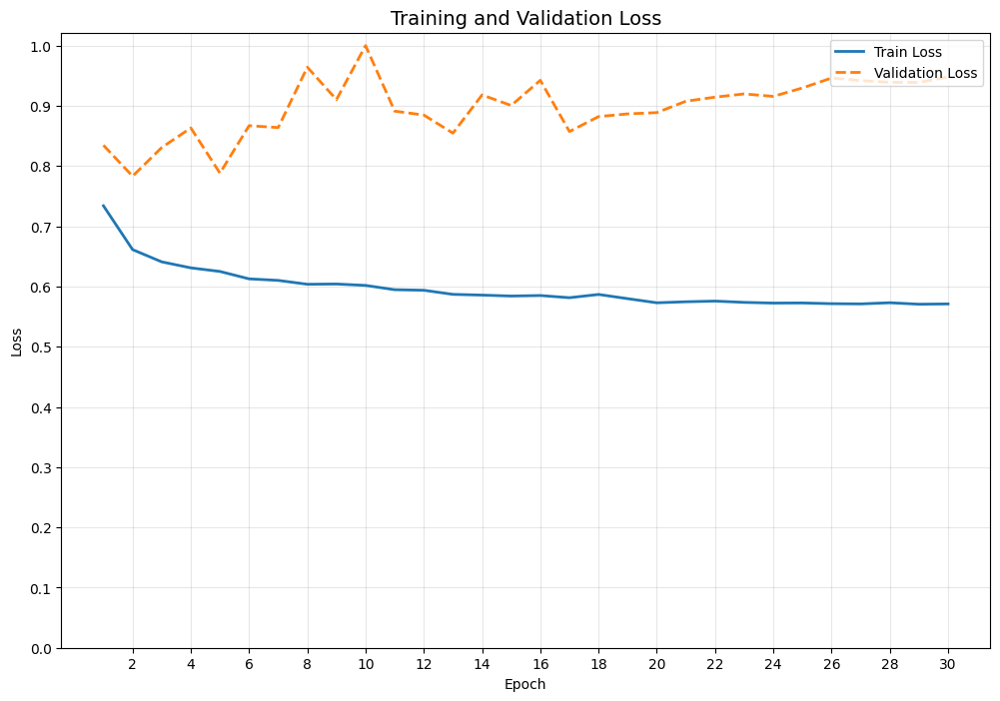

Available Metrics: ['Pixel_Accuracy', 'Precision', 'Recall', 'IOU', 'Mean_Precision', 'Mean_Recall', 'class_ious', 'class_precisions', 'class_recalls', 'Loss']


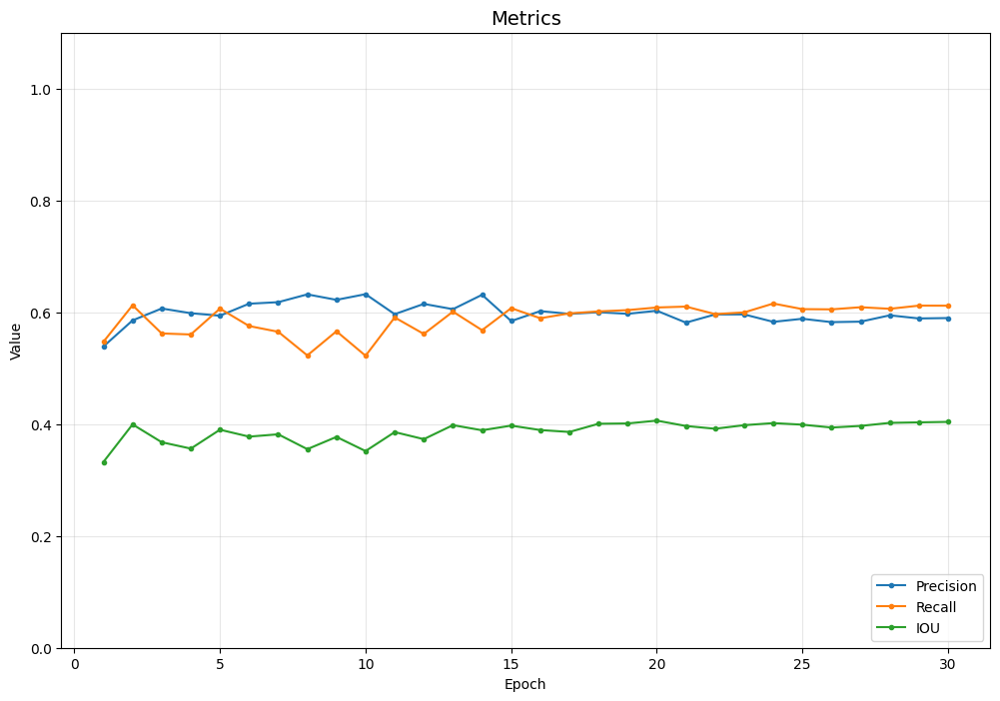

In [5]:
smol_machine.plot_loss(y_max=1)
print("Available Metrics:", smol_machine.get_available_metrics())
smol_machine.plot_metrics("Metrics")

Sample 0 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 538.143]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 2, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


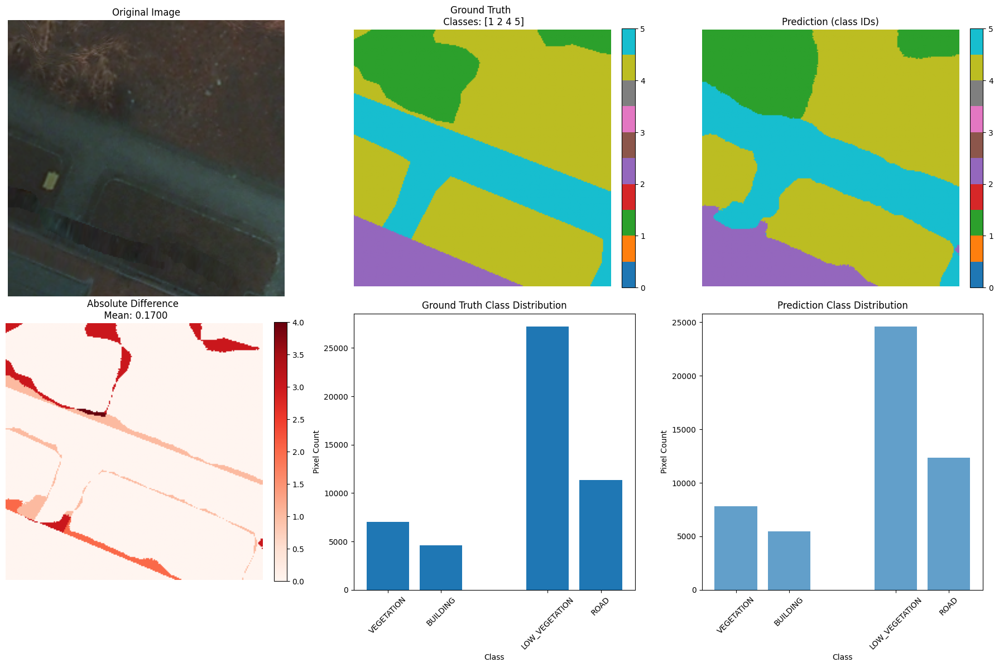


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,044 pixels (14.0%)
  BUILDING: 4,597 pixels (9.2%)
  LOW_VEGETATION: 27,200 pixels (54.2%)
  ROAD: 11,335 pixels (22.6%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 3.5598

Accuracy metrics:
  Pixel-wise accuracy: 0.9145 (91.45%)
  Mean absolute error: 0.1700
  Max error: 4.0000
  ✅ Very good predictions!
Sample 1 info:
  Image shape: torch.Size([3, 224, 224]), range: [69.307, 860.418]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 3, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


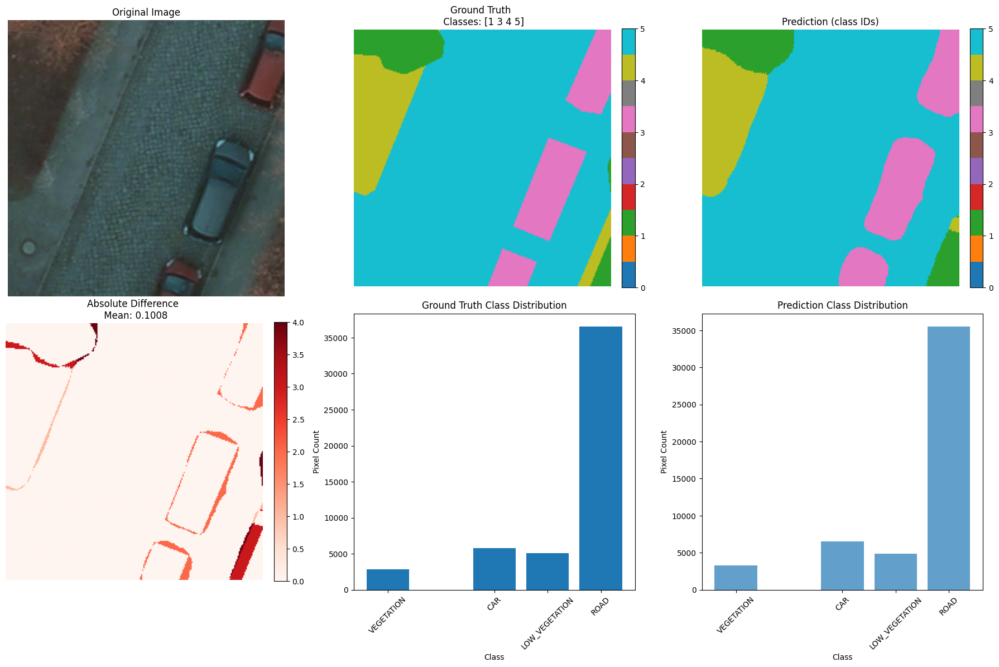


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 2,813 pixels (5.6%)
  CAR: 5,752 pixels (11.5%)
  LOW_VEGETATION: 5,073 pixels (10.1%)
  ROAD: 36,538 pixels (72.8%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 4.3815

Accuracy metrics:
  Pixel-wise accuracy: 0.9586 (95.86%)
  Mean absolute error: 0.1008
  Max error: 4.0000
  ✅ Very good predictions!
Sample 2 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 538.143]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 2, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


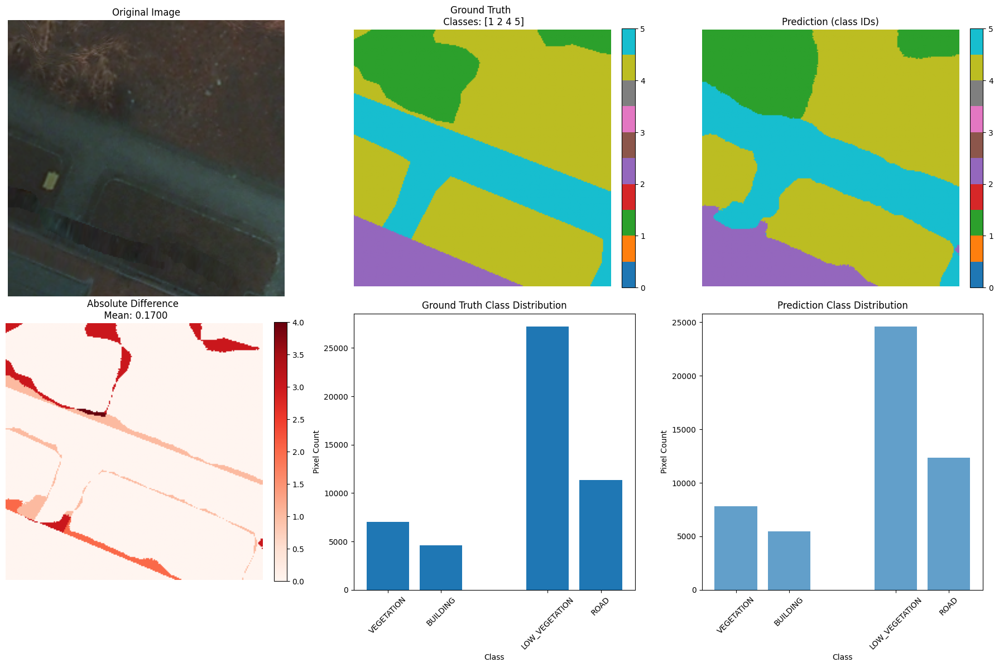


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,044 pixels (14.0%)
  BUILDING: 4,597 pixels (9.2%)
  LOW_VEGETATION: 27,200 pixels (54.2%)
  ROAD: 11,335 pixels (22.6%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 3.5598

Accuracy metrics:
  Pixel-wise accuracy: 0.9145 (91.45%)
  Mean absolute error: 0.1700
  Max error: 4.0000
  ✅ Very good predictions!
Sample 3 info:
  Image shape: torch.Size([3, 224, 224]), range: [69.307, 860.418]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 3, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


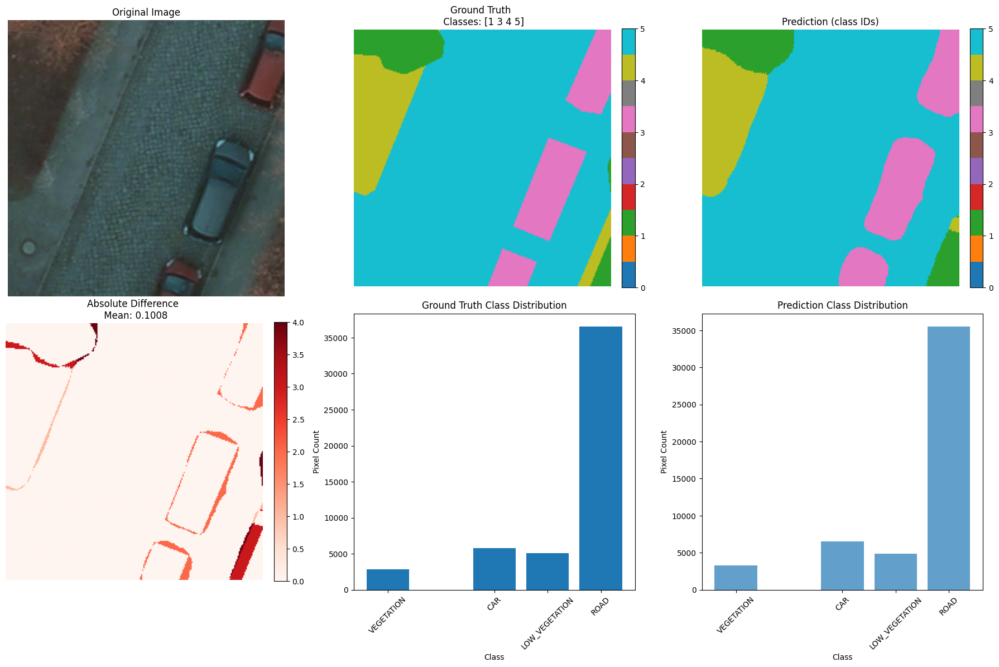


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 2,813 pixels (5.6%)
  CAR: 5,752 pixels (11.5%)
  LOW_VEGETATION: 5,073 pixels (10.1%)
  ROAD: 36,538 pixels (72.8%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 4.3815

Accuracy metrics:
  Pixel-wise accuracy: 0.9586 (95.86%)
  Mean absolute error: 0.1008
  Max error: 4.0000
  ✅ Very good predictions!
Sample 4 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 538.143]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 2, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


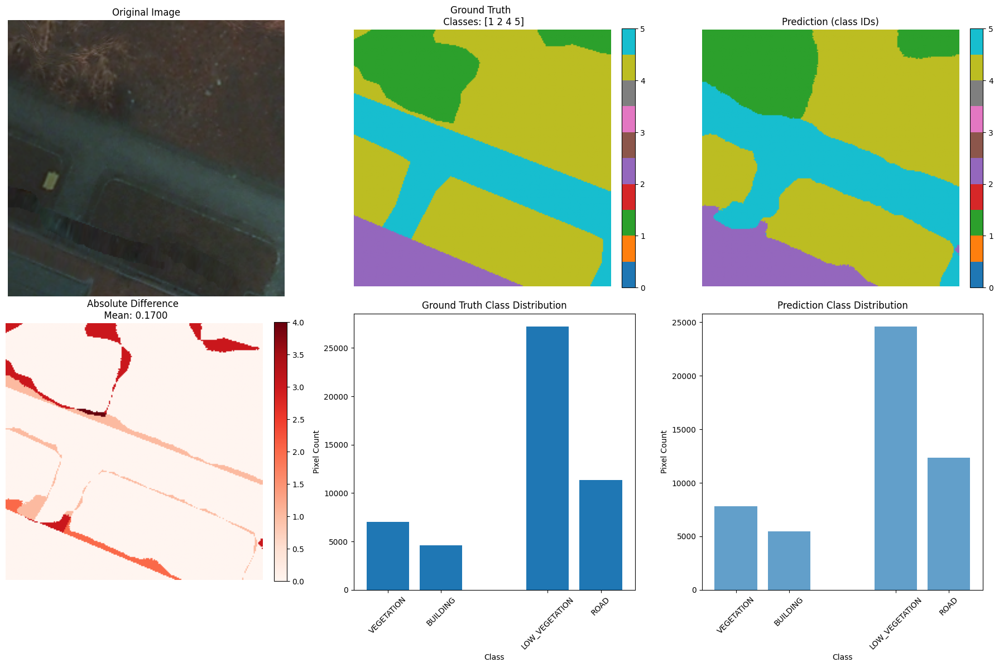


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,044 pixels (14.0%)
  BUILDING: 4,597 pixels (9.2%)
  LOW_VEGETATION: 27,200 pixels (54.2%)
  ROAD: 11,335 pixels (22.6%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 3.5598

Accuracy metrics:
  Pixel-wise accuracy: 0.9145 (91.45%)
  Mean absolute error: 0.1700
  Max error: 4.0000
  ✅ Very good predictions!
Sample 5 info:
  Image shape: torch.Size([3, 224, 224]), range: [109.307, 753.341]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 4])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 4.000]


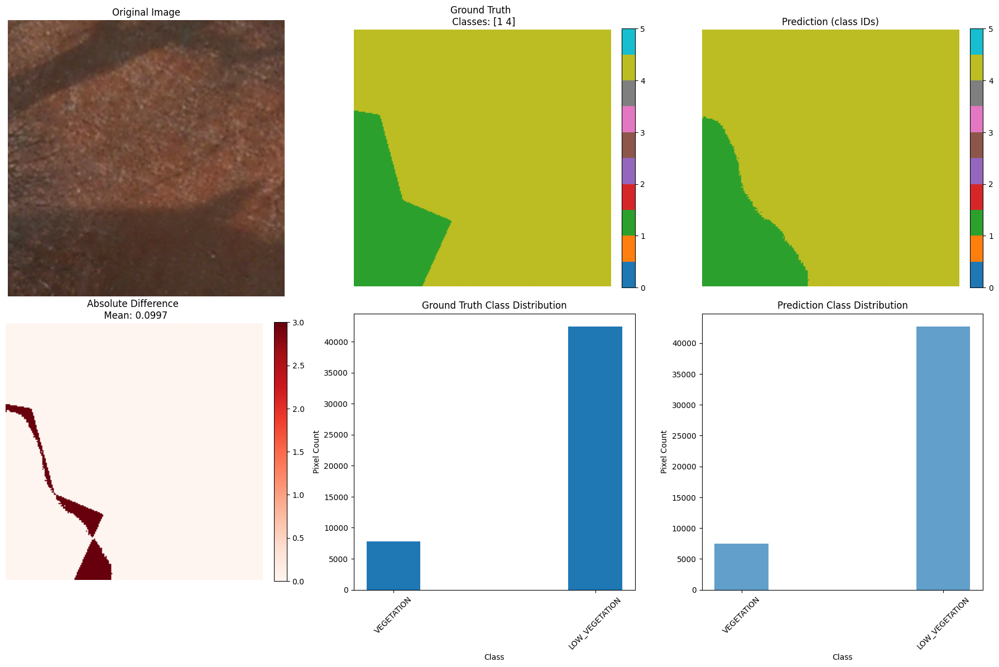


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,757 pixels (15.5%)
  LOW_VEGETATION: 42,419 pixels (84.5%)

Prediction statistics:
  Raw prediction range: [1.0000, 4.0000]
  Raw prediction mean: 3.5515

Accuracy metrics:
  Pixel-wise accuracy: 0.9668 (96.68%)
  Mean absolute error: 0.0997
  Max error: 3.0000
  ✅ Very good predictions!
Sample 6 info:
  Image shape: torch.Size([3, 224, 224]), range: [109.307, 753.341]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 4])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 4.000]


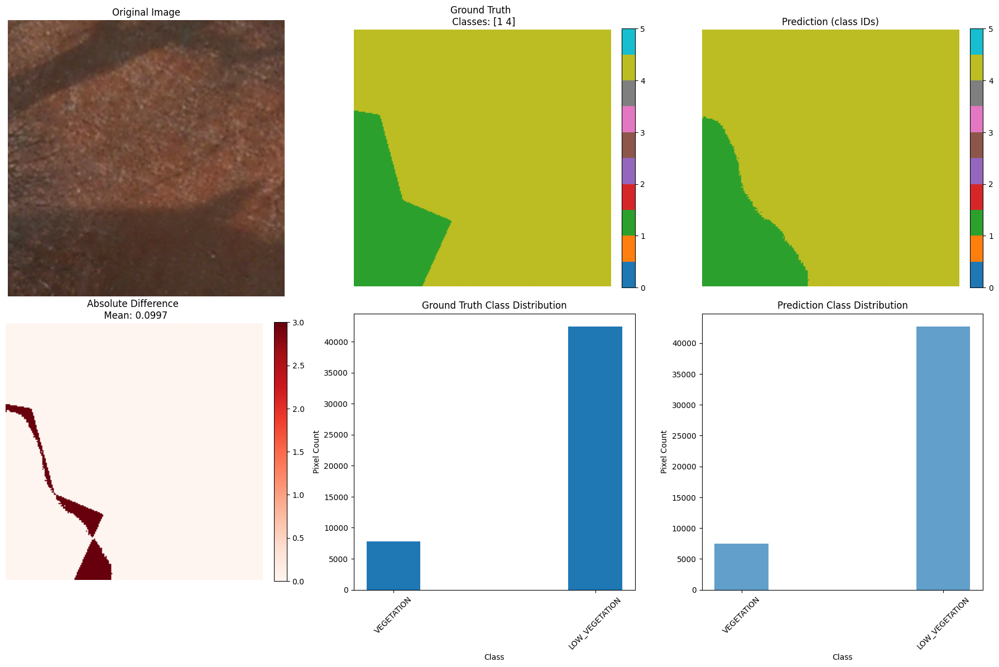


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 7,757 pixels (15.5%)
  LOW_VEGETATION: 42,419 pixels (84.5%)

Prediction statistics:
  Raw prediction range: [1.0000, 4.0000]
  Raw prediction mean: 3.5515

Accuracy metrics:
  Pixel-wise accuracy: 0.9668 (96.68%)
  Mean absolute error: 0.0997
  Max error: 3.0000
  ✅ Very good predictions!
Sample 7 info:
  Image shape: torch.Size([3, 224, 224]), range: [33.751, 753.341]
  Target shape: torch.Size([224, 224]), unique values: tensor([1, 3, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [1.000, 5.000]


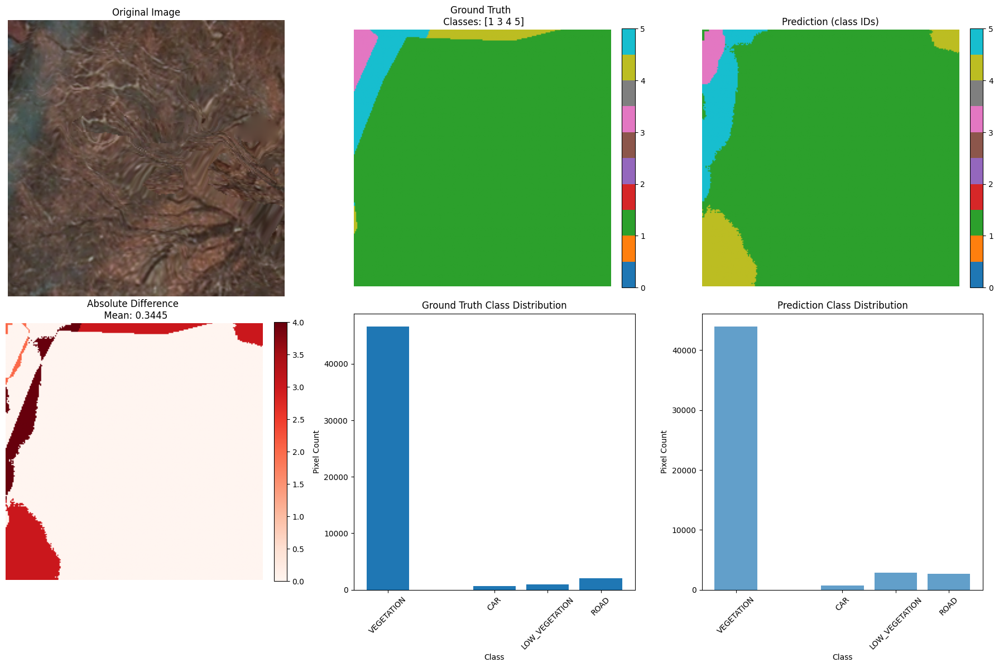


DETAILED ANALYSIS:
Target class distribution:
  VEGETATION: 46,576 pixels (92.8%)
  CAR: 638 pixels (1.3%)
  LOW_VEGETATION: 942 pixels (1.9%)
  ROAD: 2,020 pixels (4.0%)

Prediction statistics:
  Raw prediction range: [1.0000, 5.0000]
  Raw prediction mean: 1.4125

Accuracy metrics:
  Pixel-wise accuracy: 0.8938 (89.38%)
  Mean absolute error: 0.3445
  Max error: 4.0000
  📊 Decent predictions
Sample 8 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 673.751]
  Target shape: torch.Size([224, 224]), unique values: tensor([0, 1, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [0.000, 5.000]


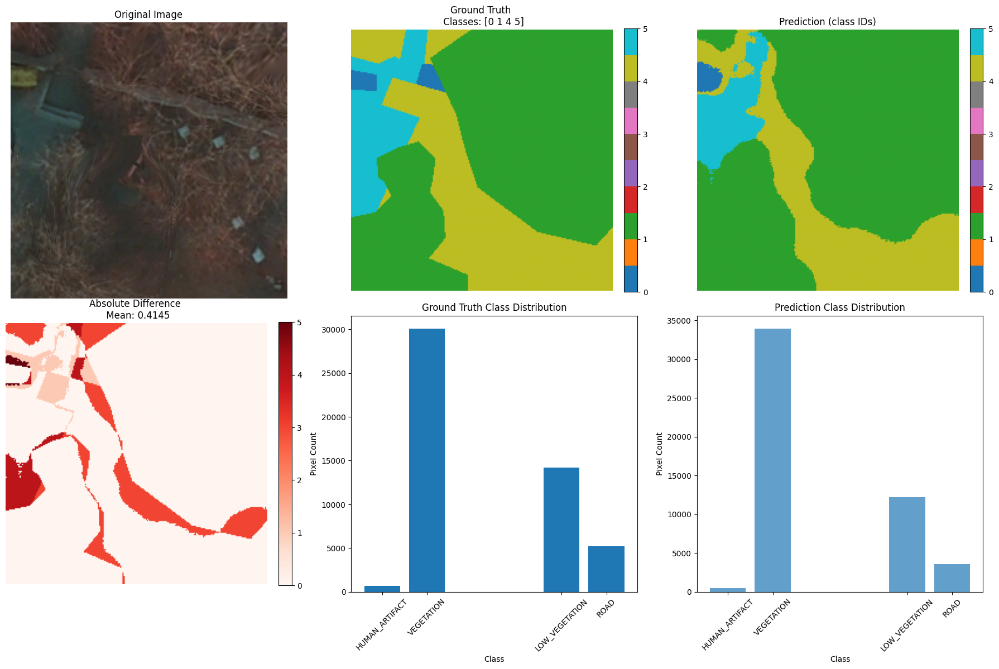


DETAILED ANALYSIS:
Target class distribution:
  HUMAN_ARTIFACT: 688 pixels (1.4%)
  VEGETATION: 30,070 pixels (59.9%)
  LOW_VEGETATION: 14,221 pixels (28.3%)
  ROAD: 5,197 pixels (10.4%)

Prediction statistics:
  Raw prediction range: [0.0000, 5.0000]
  Raw prediction mean: 2.0089

Accuracy metrics:
  Pixel-wise accuracy: 0.8527 (85.27%)
  Mean absolute error: 0.4145
  Max error: 5.0000
  📊 Decent predictions
Sample 9 info:
  Image shape: torch.Size([3, 224, 224]), range: [64.862, 673.751]
  Target shape: torch.Size([224, 224]), unique values: tensor([0, 1, 4, 5])
  Prediction shape: torch.Size([224, 224]), range: [0.000, 5.000]


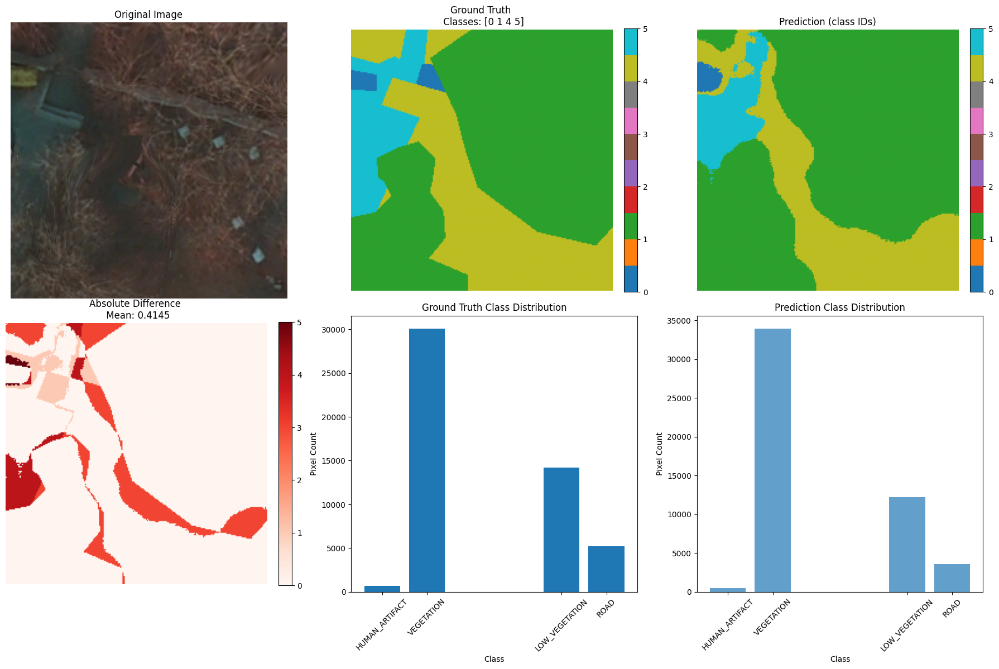


DETAILED ANALYSIS:
Target class distribution:
  HUMAN_ARTIFACT: 688 pixels (1.4%)
  VEGETATION: 30,070 pixels (59.9%)
  LOW_VEGETATION: 14,221 pixels (28.3%)
  ROAD: 5,197 pixels (10.4%)

Prediction statistics:
  Raw prediction range: [0.0000, 5.0000]
  Raw prediction mean: 2.0089

Accuracy metrics:
  Pixel-wise accuracy: 0.8527 (85.27%)
  Mean absolute error: 0.4145
  Max error: 5.0000
  📊 Decent predictions


In [6]:
for i in range(10):
    new_dataset = MemmapDataset(np.load(IMAGE_DIR, 'r+'), np.load(LABEL_DIR, 'r+'), transforms=val_transforms)
    visualize_segmentation_results(smol_machine.model, new_dataset, raw_images=np.load(IMAGE_DIR, 'r+'), sample_idx=i, class_names=class_names, device=DEVICE)